## TOC:
* [Functions](#function-bullet)
* [Bartra ROI](#bartra-bullet)
* [PPC from Gilaie, Zhang, Levy](#ppc-bullet)
* [OFC from Zhang](#ofc-bullet)
* [mPFC and ACC](#mpfc-bullet)
* [Caudate](#caudate-bullet)
* [Striatum and STS from Levy](#striatum-bullet)
* [Insula and amygdala](#insula-bullet)
* [Parahippocampal regions](#hippo-bullet)
* [Lingual gyrus and precentral gyrus](#lingual-bullet)

In [1]:
import warnings
import sys 
if not sys.warnoptions:
    warnings.simplefilter("ignore")

import os
import numpy as np
import pandas as pd
import scipy.io
from scipy import stats
import scipy.spatial.distance as sp_distance

import nibabel as nib
import nilearn.plotting as plotting
from nilearn.input_data import NiftiMasker, NiftiSpheresMasker

import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.manifold import MDS
from sklearn.preprocessing import normalize
from nltools.mask import create_sphere

# %matplotlib notebook
%matplotlib inline
%autosave 5
sns.set(style = 'white', context='poster', rc={"lines.linewidth": 2.5})

/gpfs/ysm/project/rj299/conda_envs/py37_dev/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


Autosaving every 5 seconds


In [2]:
base_root = '/home/rj299/scratch60/mdm_analysis/'
data_root = '/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rsa_nosmooth/1stLevel/'
out_root = '/home/rj299/scratch60/mdm_analysis/output/'
anat_mean = nib.load(os.path.join('/home/rj299/project/mdm_analysis/output/imaging', 'all_sub_average.nii.gz'))

In [3]:
stims = {'01': 'Med_amb_24', '02': 'Med_amb_50', '03': 'Med_amb_74',
         '04': 'Med_risk_25', '05': 'Med_risk_50', '06': 'Med_risk_75', 
         '07': 'Mon_amb_24', '08': 'Mon_amb_50', '09': 'Mon_amb_74', 
         '10': 'Mon_risk_25', '11': 'Mon_risk_50', '12': 'Mon_risk_75'}

stim_num = len(stims)

subjects = [2073, 2550, 2582, 2583, 2584, 2585, 2588, 2592, 
            2593, 2594, 2596, 2597, 2598, 2599, 2600, 2624, 
            2650, 2651, 2652, 2653, 2654, 2655, 2656, 2657, 
            2658, 2659, 2660, 2661, 2662, 2663, 2664, 2665, 2666]

In [4]:
# all rois' names
sub = 2654
roi_rdm_obj = np.load('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_uncert_rsa/rdm_new/_subject_id_%s/roi_rdm_uncert.npy' %sub,
              allow_pickle = True)
roi_rdm = roi_rdm_obj.item()
roi_names_all = list(roi_rdm.keys())

print('All names of ROIs:')
for roi_name in roi_names_all:
    print(roi_name)

All names of ROIs:
vmpfc
vstr
med_mon_1
med_mon_2
med_mon_3
gilaie_rppc
zhang_val_lppc
zhang_val_lofc
zhang_val_rofc
zhang_val_lingual
zhang_sal_acc
zhang_sal_lprecentral
zhang_sal_lcaudate
zhang_sal_rcaudate
zhang_sal_linsula
zhang_sal_rinsula
zhang_sal_lingual
levy_amb_striatum
levy_amb_mpfc
levy_amb_pcc
levy_amb_lamyg
levy_amb_sts
levy_risk_striatum
levy_risk_mpfc


In [5]:
# number of ROIs
len(roi_names_all)

24

## Funcitons<a class = "anchors" id = "function-bullet"></a>

In [21]:
import matplotlib.pylab as pylab
params = {'legend.fontsize': 'medium',
         'axes.labelsize': 'medium',
         'axes.titlesize':'larger',
         'xtick.labelsize':'medium',
         'ytick.labelsize':'medium'}
pylab.rcParams.update(params)

In [24]:
# function
def plot_roi_rdm(subjects, roi_names):
    
    for sub in subjects:
        roi_rdm_obj = np.load('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_uncert_rsa/rdm_new/_subject_id_%s/roi_rdm_uncert.npy' %sub,
               allow_pickle = True)

        roi_rdm = roi_rdm_obj.item()

        stim_cat = [ '', 'Med_amb', '', 'Med_risk', '', 'Mon_amb', 'Mon_risk']
#         fontsize = 11
#         fontdict = {'fontsize': fontsize}
        edges = np.array([0,3,6,9,12])-0.5

        f, ax = plt.subplots(1,len(roi_names), figsize=(12,6))

        for roi_idx in range(len(roi_names)):
            im = ax[roi_idx].imshow(roi_rdm[roi_names[roi_idx]],
                                    vmin = np.min(list(roi_rdm.values())),
                                    vmax = np.max(list(roi_rdm.values())))
            
            ax[roi_idx].set_xticklabels('', rotation = 90)
            
            ax[roi_idx].set_title('RDM, '+roi_names[roi_idx] + ', %s ' %sub)
            ax[roi_idx].set_xlabel('condition')
            if roi_idx == 0:
                ax[roi_idx].set_ylabel('condition')
                ax[roi_idx].set_yticklabels(stim_cat)
            else:
                ax[roi_idx].set_ylabel('')
                ax[roi_idx].set_yticklabels('')
            ax[roi_idx].vlines(edges,min(edges),max(edges))
            ax[roi_idx].hlines(edges,min(edges),max(edges))
            f.colorbar(im, ax=ax[roi_idx], shrink = 0.5)

        f.subplots_adjust(wspace = 0.25)

        f1, ax1 = plt.subplots(1,len(roi_names), figsize=(12, 4))

        for (roi_idx, roi_name) in enumerate(roi_names):
            # Create the MDS object
            mds = MDS(n_components=2, dissimilarity="precomputed", random_state=0)
            results = mds.fit(roi_rdm[roi_name])

            coords = results.embedding_

            level = [1,2,3,1,2,3,1,2,3,1,2,3] 
            uncert = ['Amb','Amb','Amb','Risk','Risk','Risk',
                      'Amb','Amb','Amb','Risk','Risk','Risk']
            domain = ['Med','Med','Med','Med','Med','Med',
                      'Mon','Mon','Mon','Mon','Mon','Mon']

            mds_coord = pd.DataFrame({'x': coords[:,0], 'y': coords[:,1], 'level': level,
                        'uncertainty': uncert, 'domain': domain})    


            sns.scatterplot(x='x', y = 'y',
                            size = 'level', hue = 'uncertainty', style = 'domain',
                            data=mds_coord, legend = 'full',
                            ax = ax1[roi_idx])

            if roi_idx == len(roi_names)-1:
                ax1[roi_idx].legend(markerscale = 1, loc = 'right', bbox_to_anchor=(1.35, .5))
            else:
                ax1[roi_idx].legend().remove()

            ax1[roi_idx].set_title('MDS, ' + roi_name + ', %s' %sub);

        f1.subplots_adjust(wspace = 0.3)    


In [28]:
def plot_roi_average_rdm(subjects, roi_names):
    roi_rdm = {}

    for roi_name in roi_names:
        roi_rdm[roi_name] = []

    for sub in subjects:
        roi_rdm_sub_obj = np.load('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_uncert_rsa/rdm_new/_subject_id_%s/roi_rdm_uncert.npy' %sub,
           allow_pickle = True)

        roi_rdm_sub = roi_rdm_sub_obj.item()

        for roi_name in roi_names:
            roi_rdm[roi_name].append(roi_rdm_sub[roi_name]) 
    
    stim_cat = ['', 'Med_amb', '', 'Med_risk', '', 'Mon_amb', 'Mon_risk']
    edges = np.array([0,3,6,9,12])-0.5

    roi_rdm_mean = {}
    for roi_name in roi_names:
        roi_rdm_mean[roi_name] = np.mean(roi_rdm[roi_name], axis=0)

        
    f, ax = plt.subplots(1,len(roi_names), figsize=(12,6))

    for roi_idx in range(len(roi_names)):
        im = ax[roi_idx].imshow(roi_rdm_mean[roi_names[roi_idx]],
                               vmin = np.min(list(roi_rdm_mean.values())),
                               vmax = np.max(list(roi_rdm_mean.values())))
        
        ax[roi_idx].set_xticklabels('', rotation = 90)
        
        ax[roi_idx].set_title('RDM '+roi_names[roi_idx] + ' %s sub Average' %len(subjects)) 
        ax[roi_idx].set_xlabel('condition')
        if roi_idx == 0:
            ax[roi_idx].set_ylabel('condition')
            ax[roi_idx].set_yticklabels(stim_cat)
        else:
            ax[roi_idx].set_ylabel('')
            ax[roi_idx].set_yticklabels('')
        ax[roi_idx].vlines(edges,min(edges),max(edges))
        ax[roi_idx].hlines(edges,min(edges),max(edges))
        f.colorbar(im, ax=ax[roi_idx], shrink = 0.5)


    f.subplots_adjust(wspace = 0.25) 
    
    # MDS    
    f, ax = plt.subplots(1, len(roi_names), figsize=(12,4))
    
    for roi_idx, roi_name in enumerate(roi_names):
        # Create the MDS object
        mds = MDS(n_components=2, dissimilarity="precomputed", random_state=0)
        results = mds.fit(roi_rdm_mean[roi_name])

        coords = results.embedding_

        level = [1,2,3,1,2,3,1,2,3,1,2,3] 
        uncert = ['Amb','Amb','Amb','Risk','Risk','Risk',
                  'Amb','Amb','Amb','Risk','Risk','Risk']
        domain = ['Med','Med','Med','Med','Med','Med',
                  'Mon','Mon','Mon','Mon','Mon','Mon']

        mds_coord = pd.DataFrame({'x': coords[:,0], 'y': coords[:,1], 'level': level,
                    'uncertainty': uncert, 'domain': domain})    


        sns.scatterplot(x='x', y = 'y', 
                        size = 'level', hue = 'uncertainty', style = 'domain',
                        data=mds_coord, legend = 'full', ax = ax[roi_idx])
        
        ax[roi_idx].legend(markerscale = 1, loc = 'right', bbox_to_anchor=(1.3, .5))
        
        if roi_idx == len(roi_names)-1:
            ax[roi_idx].legend(markerscale = 1, loc = 'right', bbox_to_anchor=(1.35, .5))
        else:
            ax[roi_idx].legend().remove()

        ax[roi_idx].set_title('MDS, 2D,' + ' ' + roi_name);    

## Bartra ROI<a class="anchor" id="bartra-bullet"></a>

In [8]:
roi_names = ['vmpfc', 'vstr']

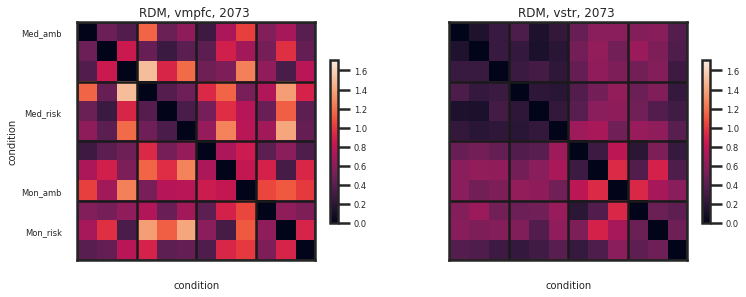

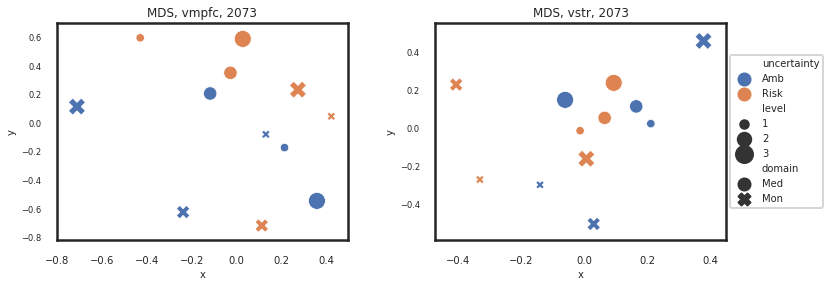

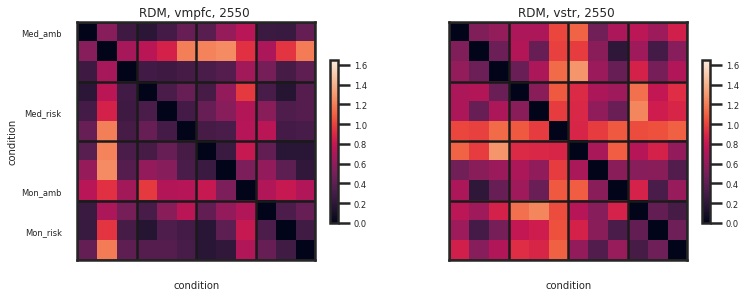

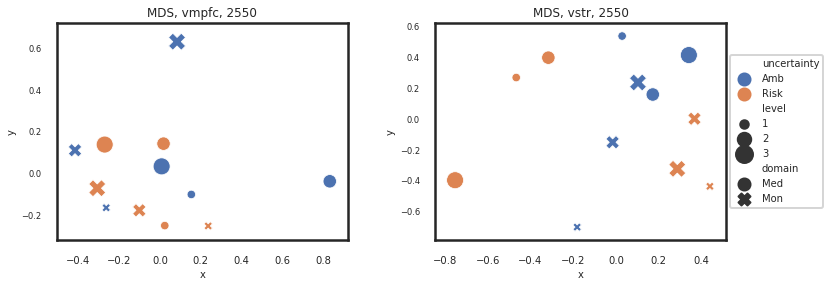

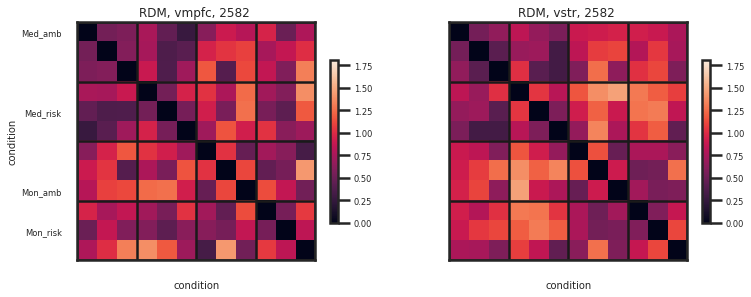

...

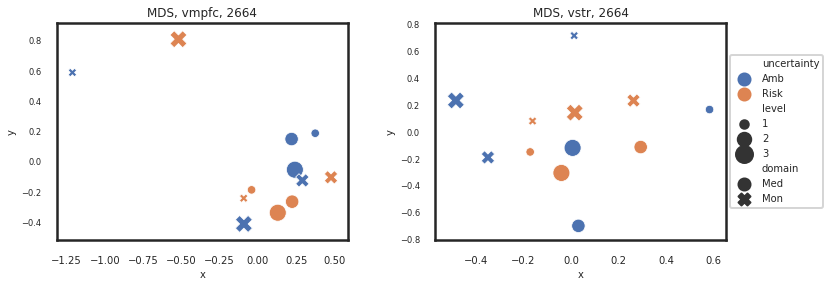

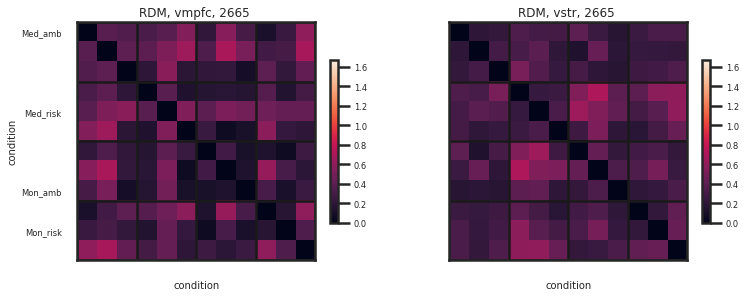

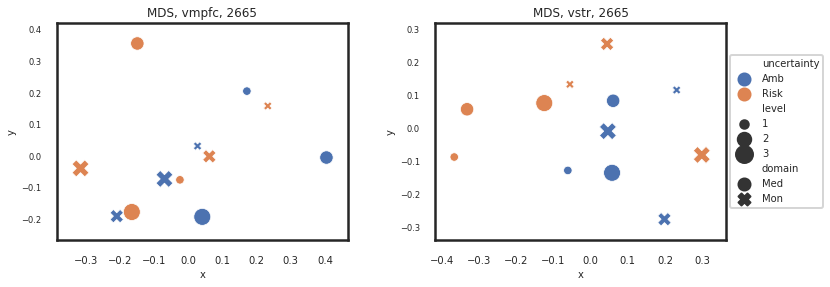

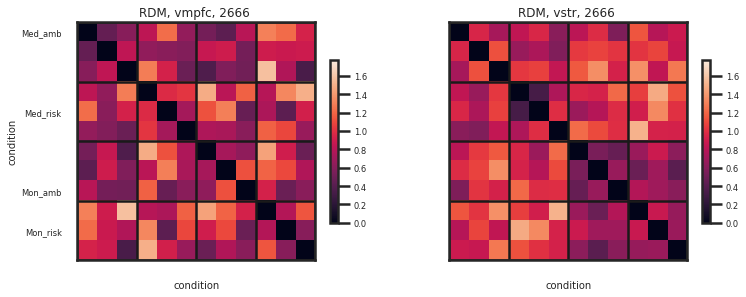

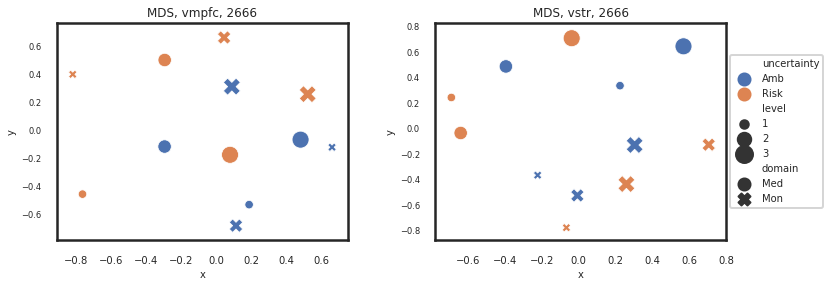

In [26]:
plot_roi_rdm(subjects, roi_names)
# plot_roi_rdm([2655], roi_names)

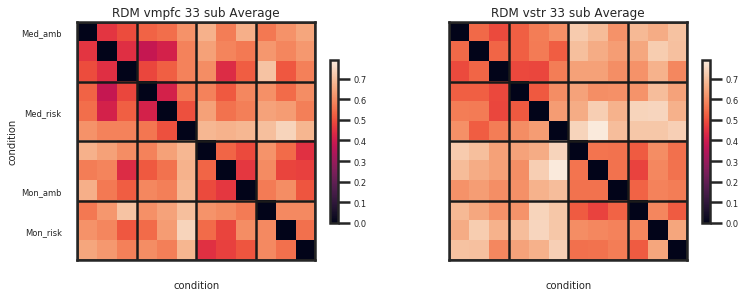

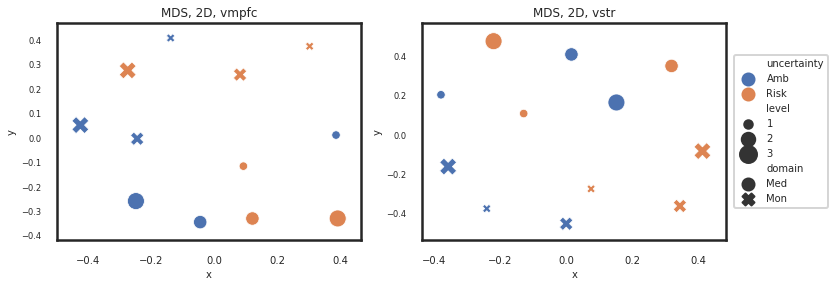

In [29]:
plot_roi_average_rdm(subjects, roi_names)

## PPC <a class="anchor" id="ppc-bullet"></a>

In [34]:
# roi_names = ['gilaie_rppc', 'zhang_val_lppc', 'levy_amb_ppc']
roi_names = ['gilaie_rppc', 'zhang_val_lppc']

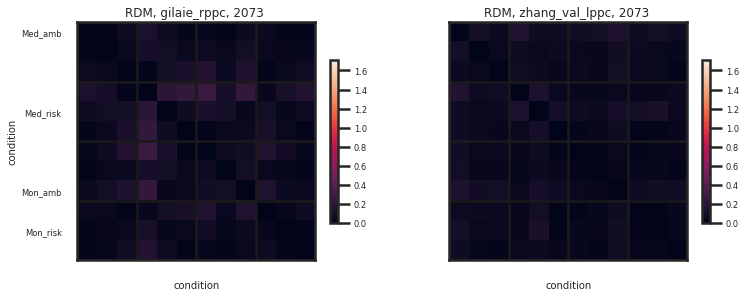

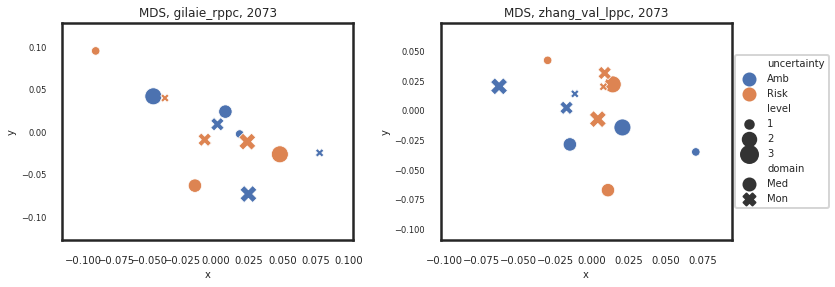

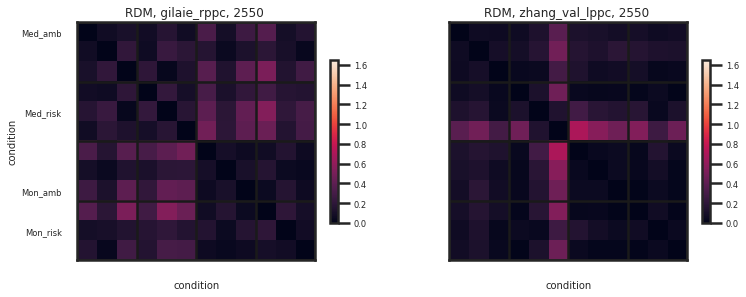

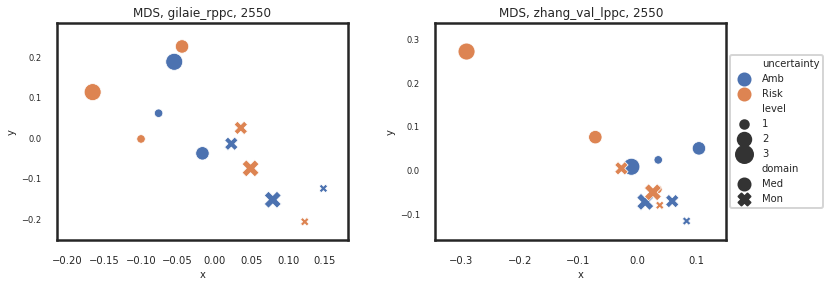

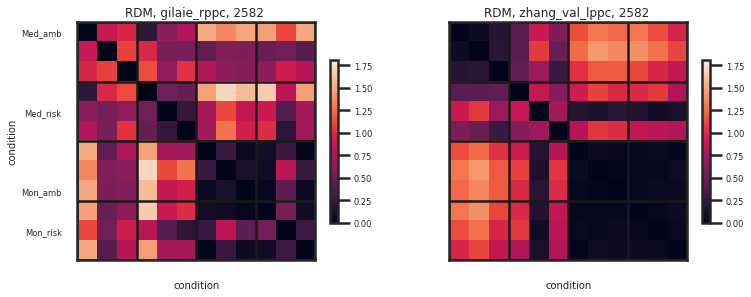

...

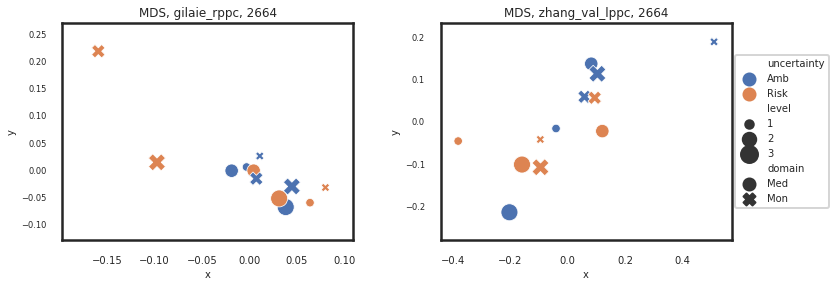

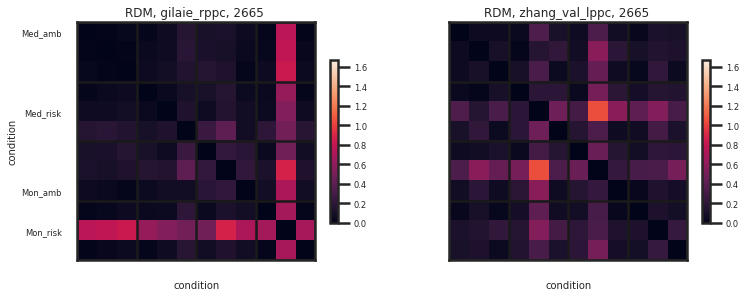

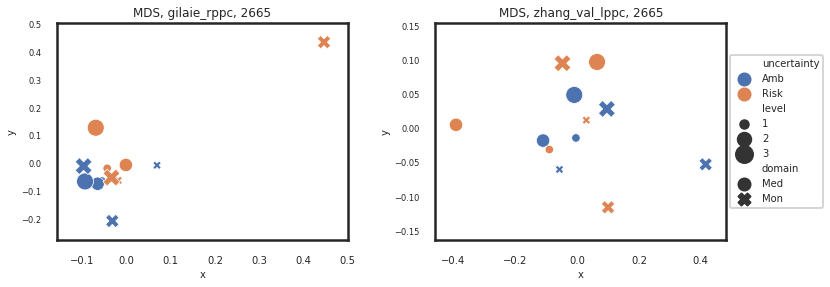

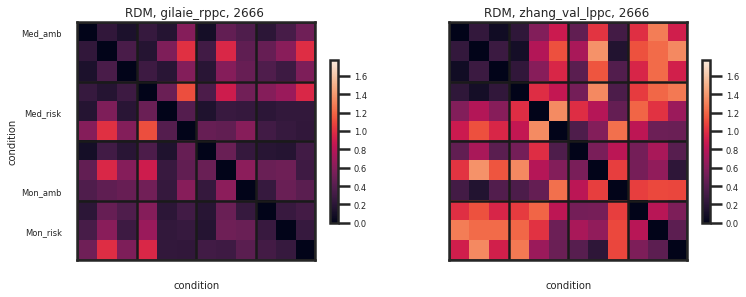

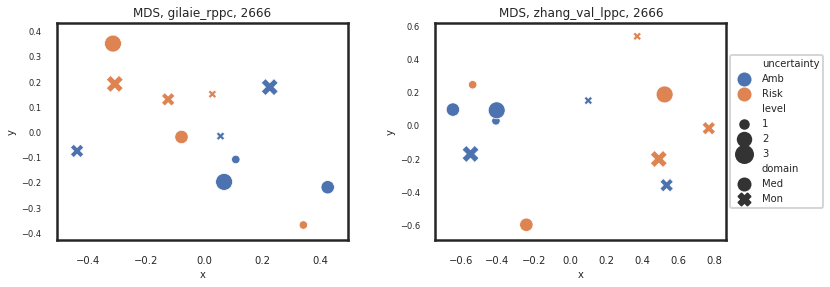

In [35]:
plot_roi_rdm(subjects, roi_names)

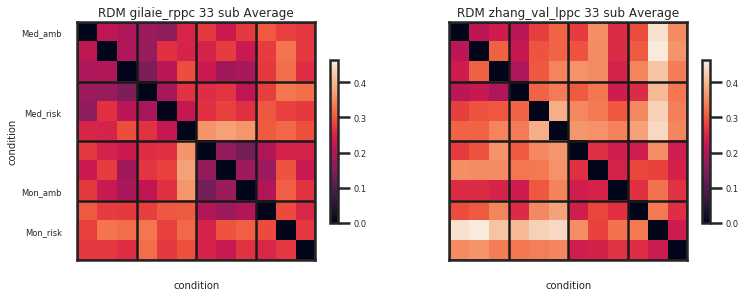

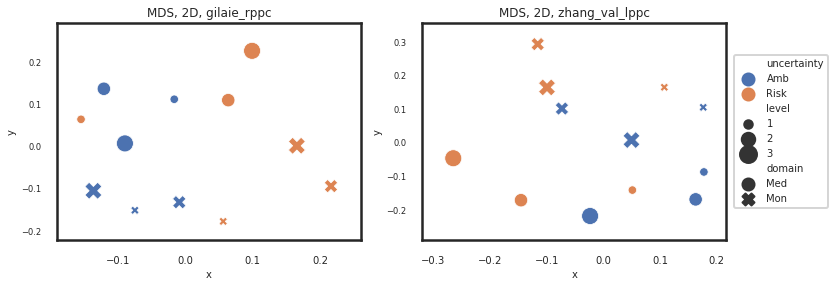

In [36]:
plot_roi_average_rdm(subjects, roi_names)

## OFC<a class="anchor" id="ofc-bullet"></a>

In [37]:
roi_names = ['zhang_val_lofc', 'zhang_val_rofc']

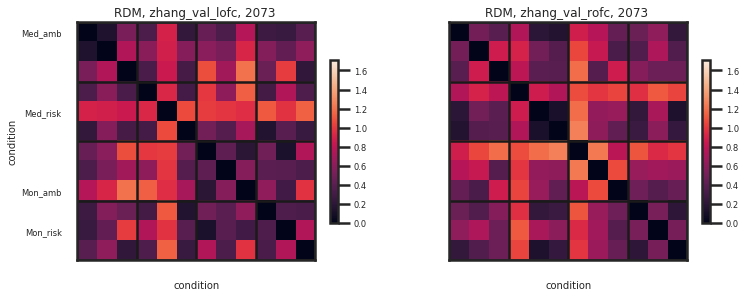

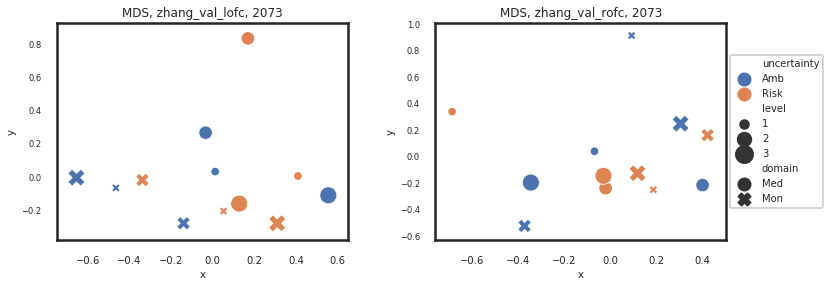

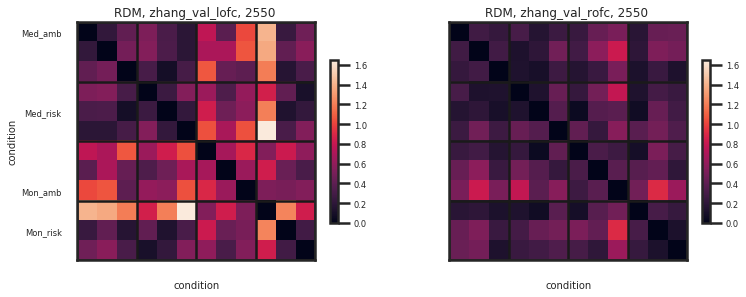

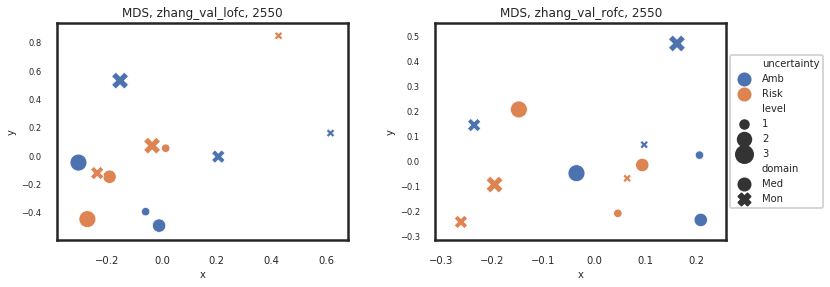

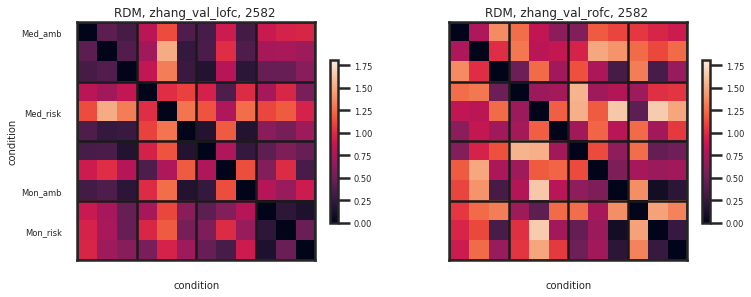

...

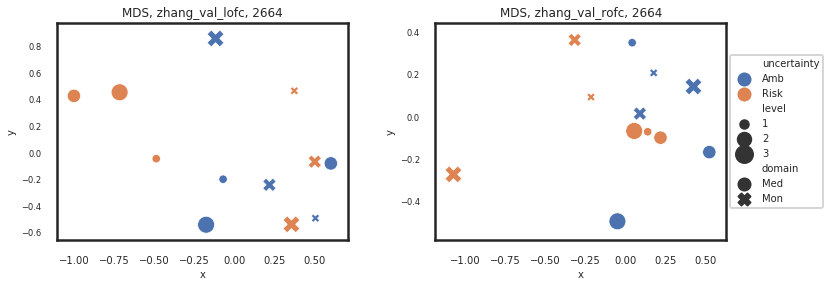

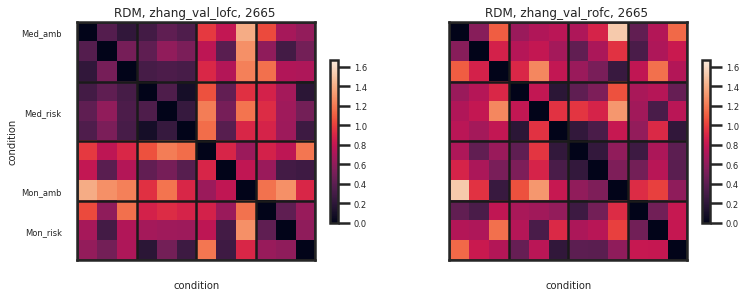

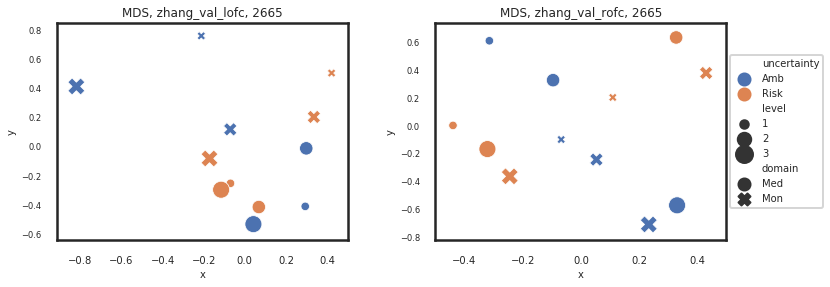

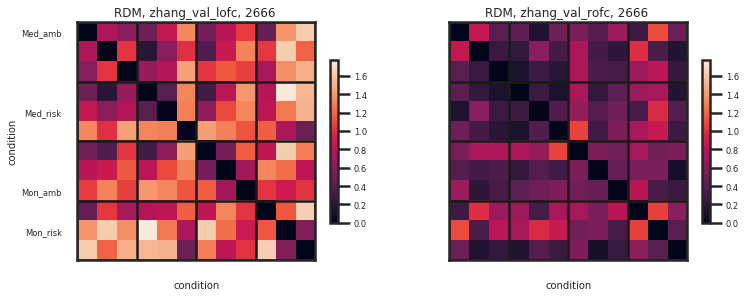

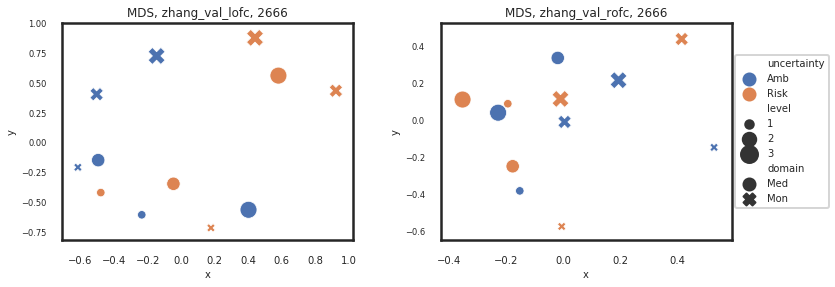

In [38]:
plot_roi_rdm(subjects, roi_names)

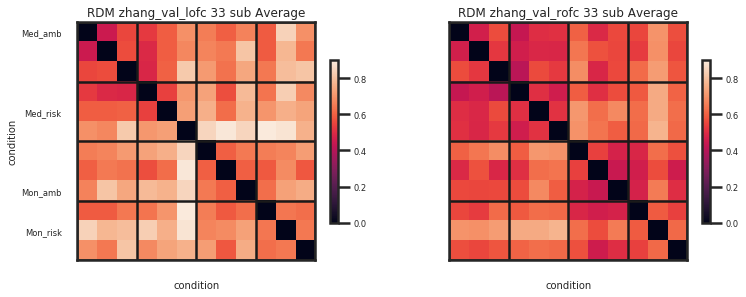

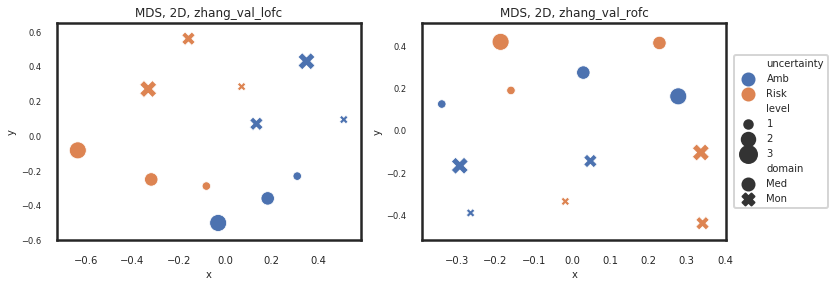

In [39]:
plot_roi_average_rdm(subjects, roi_names)

## mPFC and ACC<a class="anchor" id="mpfc-bullet"></a>

In [40]:
roi_names = ['zhang_sal_acc', 'levy_amb_mpfc', 'levy_risk_mpfc']

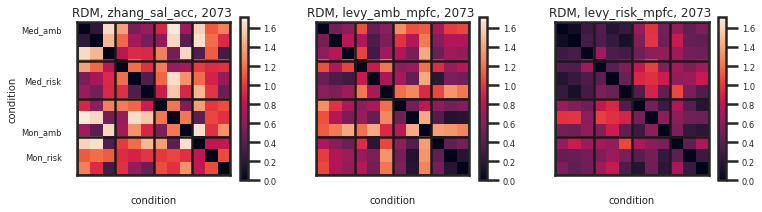

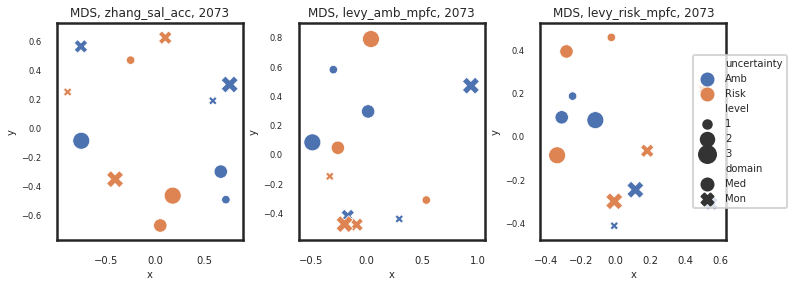

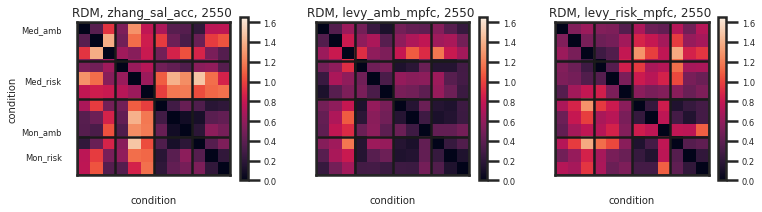

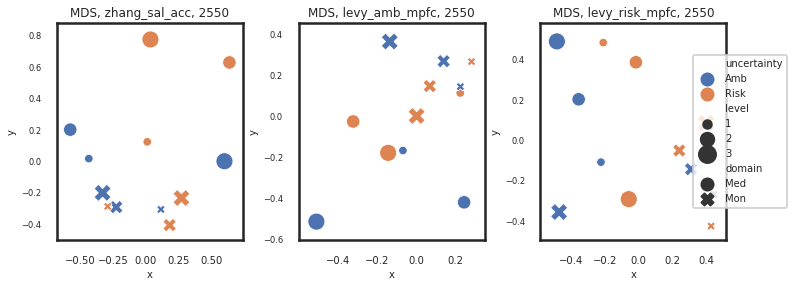

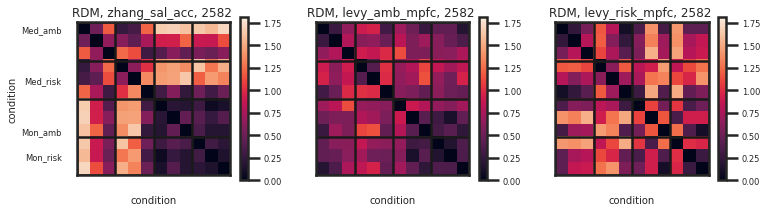

...

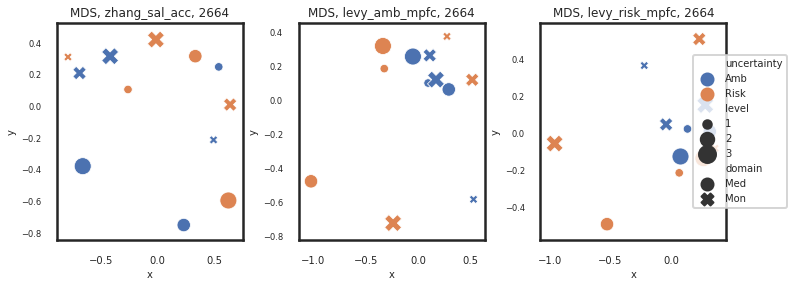

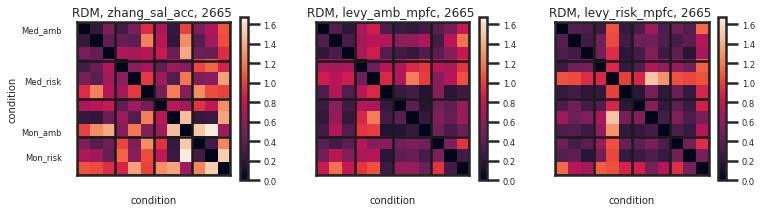

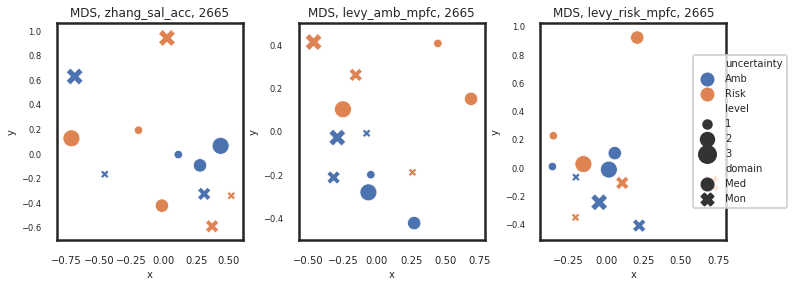

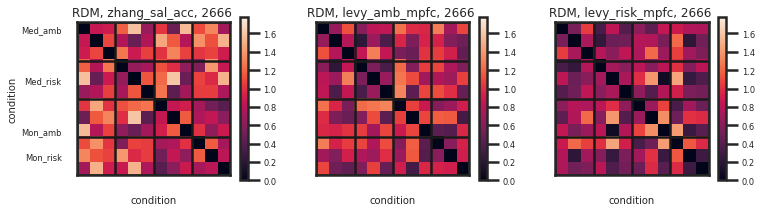

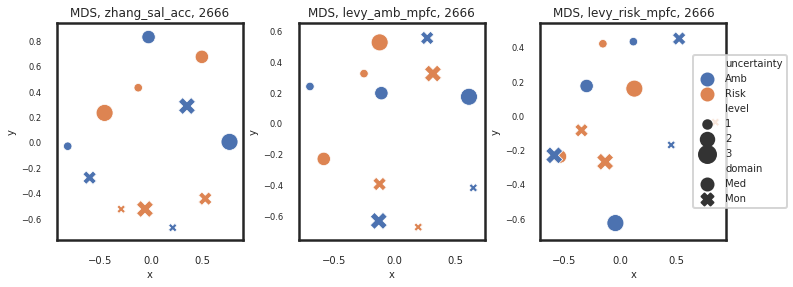

In [41]:
plot_roi_rdm(subjects, roi_names)

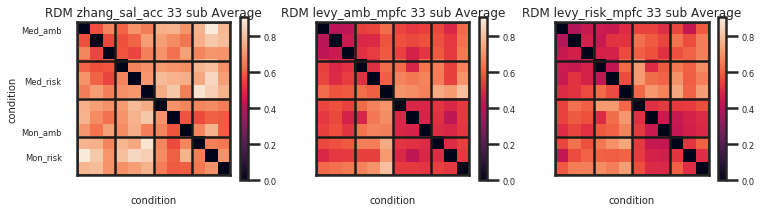

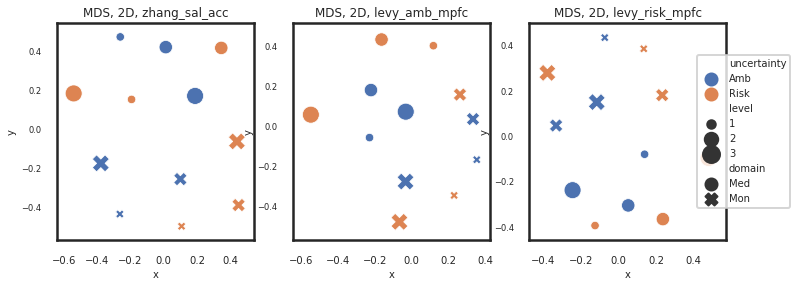

In [42]:
plot_roi_average_rdm(subjects, roi_names)

## Caudate from Zhang<a class = "anchor" id = "caudate-bullet"></a>

In [43]:
roi_names = ['zhang_sal_lcaudate', 'zhang_sal_rcaudate']

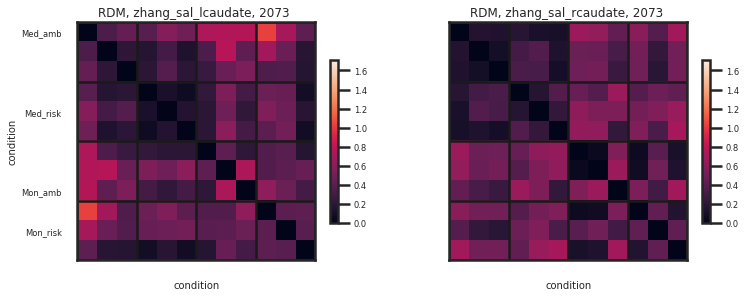

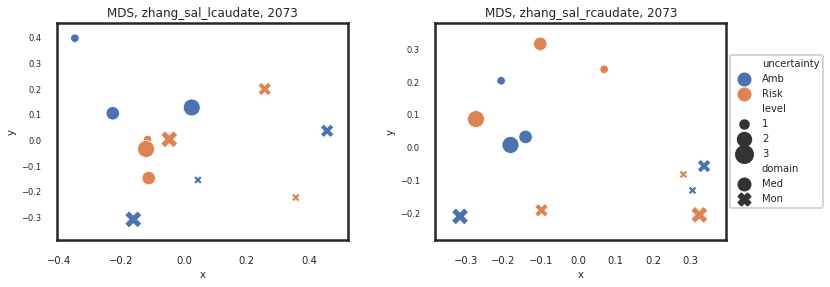

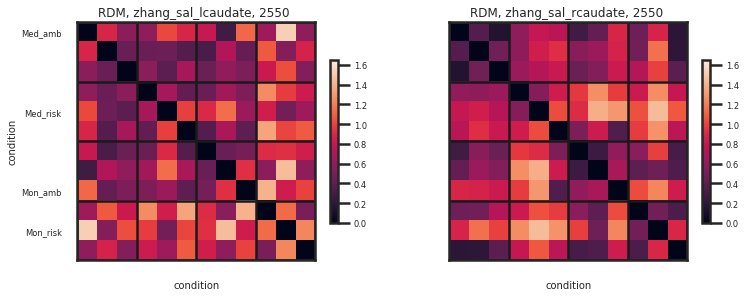

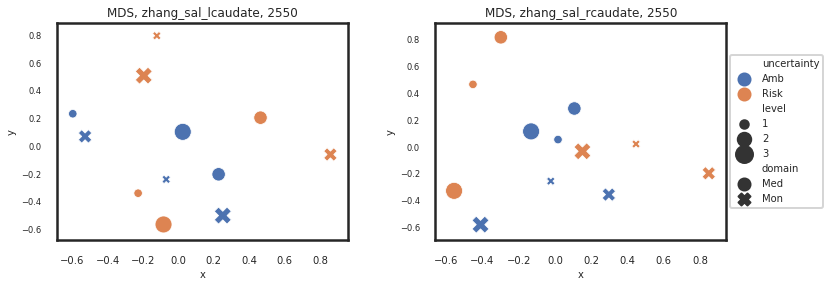

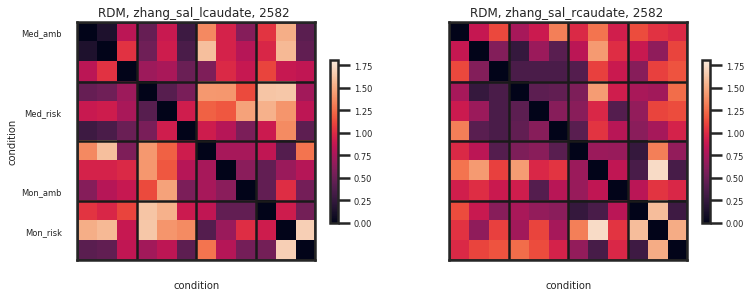

...

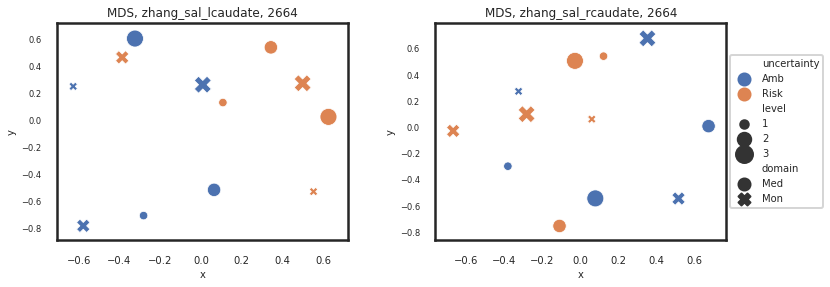

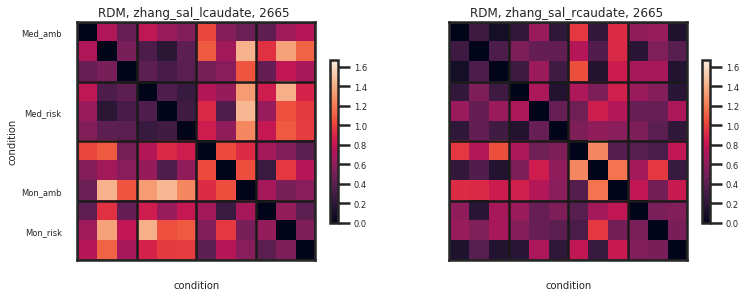

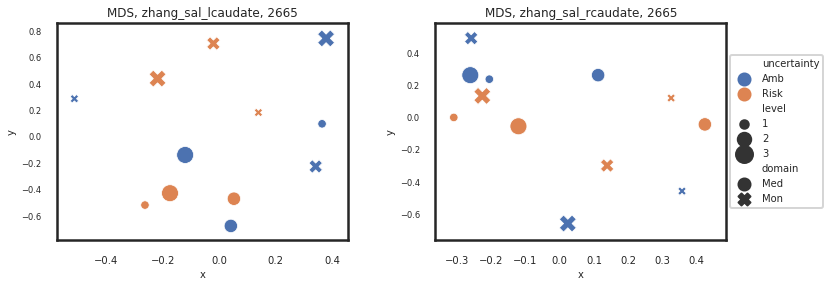

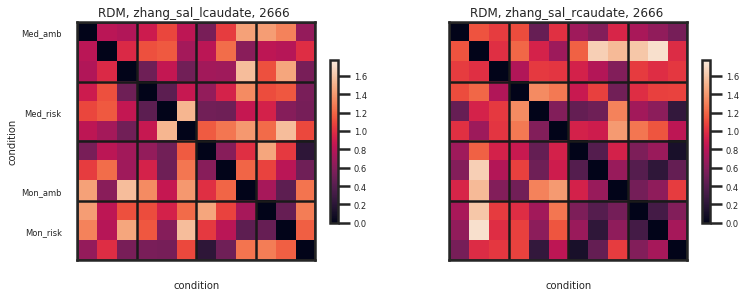

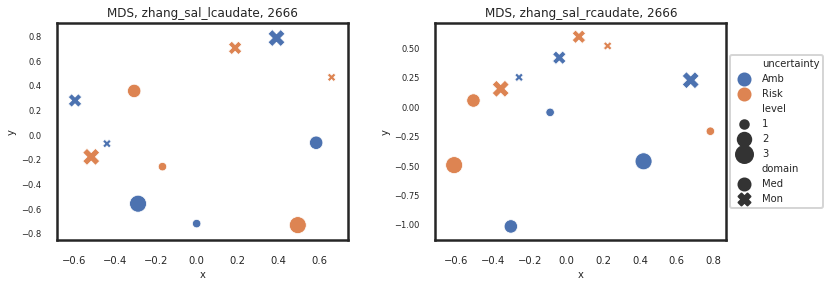

In [44]:
plot_roi_rdm(subjects, roi_names)

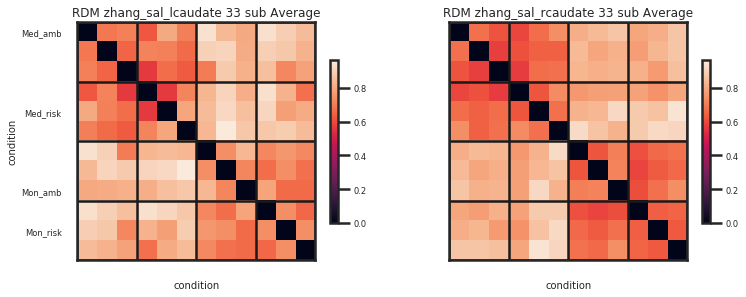

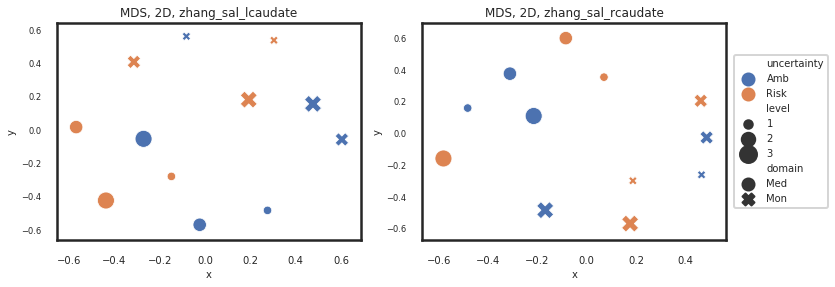

In [45]:
plot_roi_average_rdm(subjects, roi_names)

## Striatum, and STS from Levy<a class="anchor" id="striatum-bullet"></a>

In [46]:
roi_names = ['levy_amb_striatum', 'levy_risk_striatum', 'levy_amb_sts']

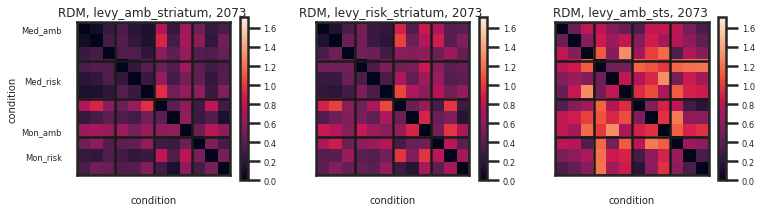

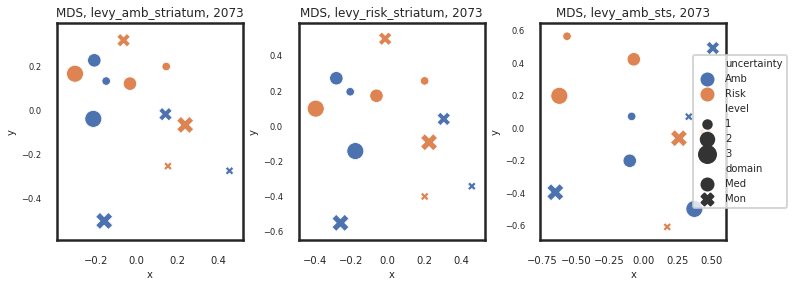

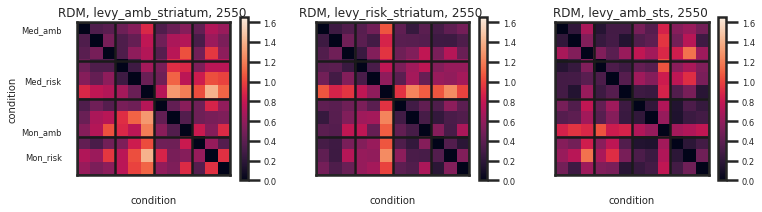

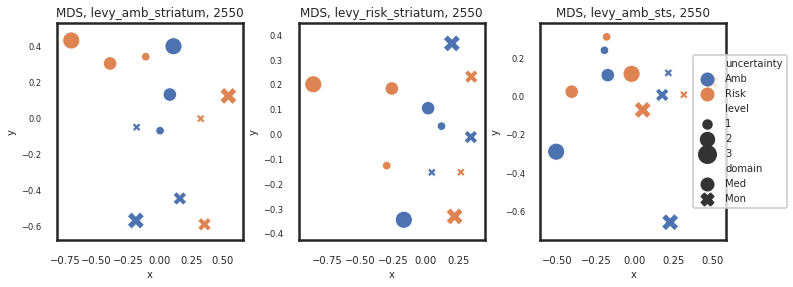

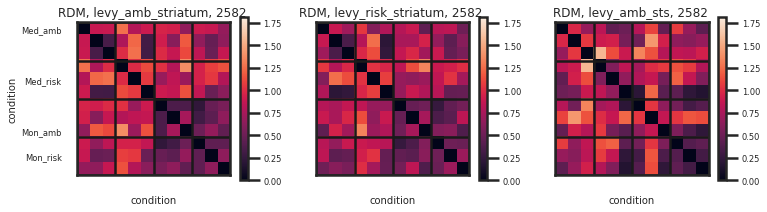

...

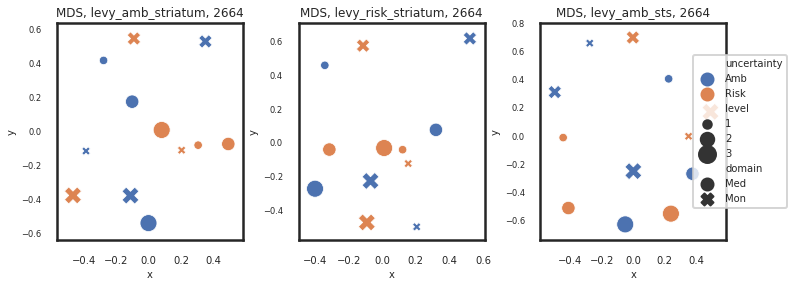

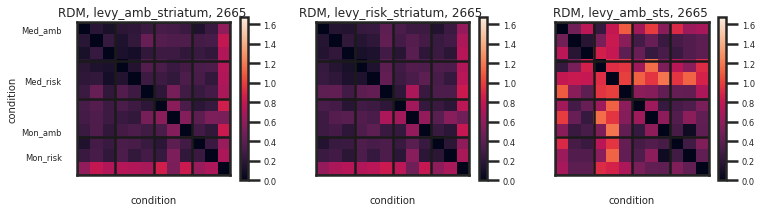

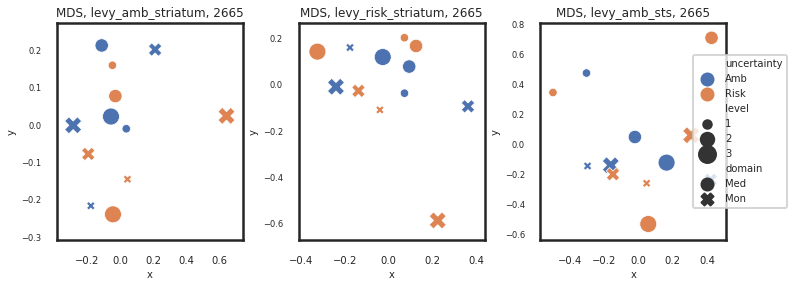

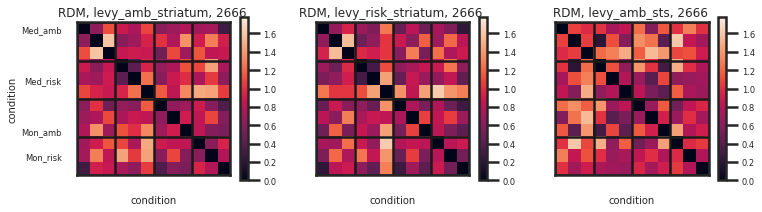

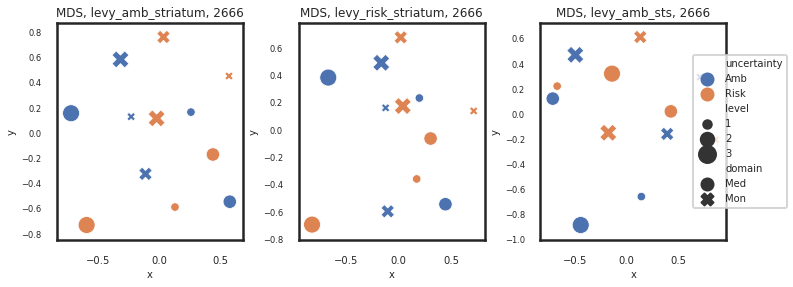

In [47]:
plot_roi_rdm(subjects, roi_names)

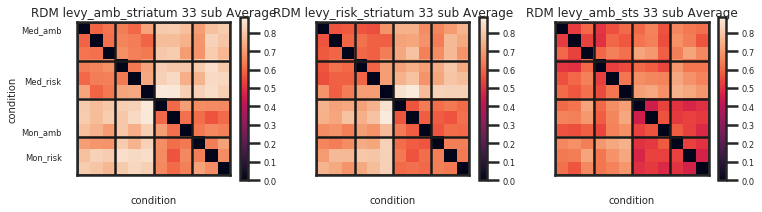

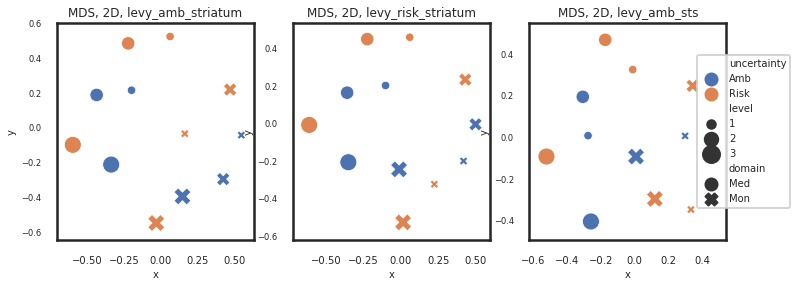

In [48]:
plot_roi_average_rdm(subjects, roi_names)

## Insula and amygdala<a class="anchor" id = "insula-bullet"></a>

In [49]:
roi_names = ['zhang_sal_linsula', 'zhang_sal_rinsula', 'levy_amb_lamyg']

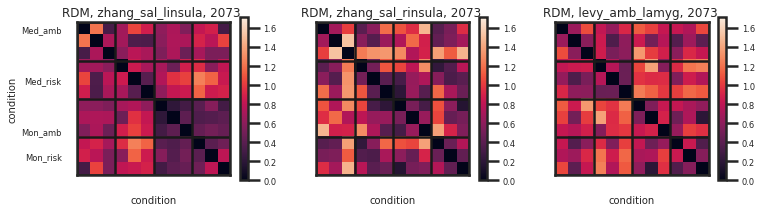

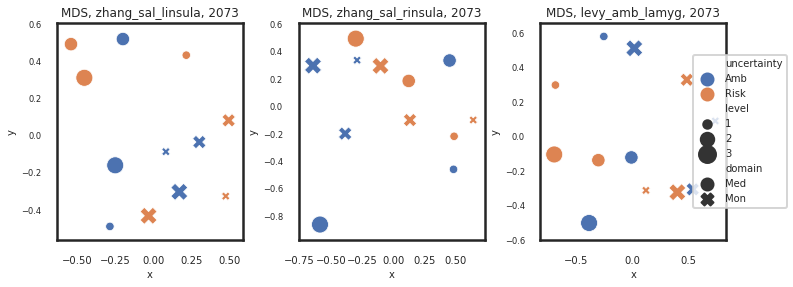

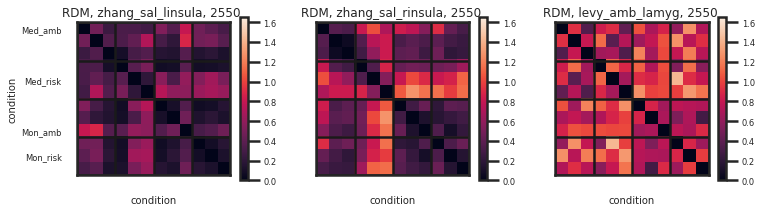

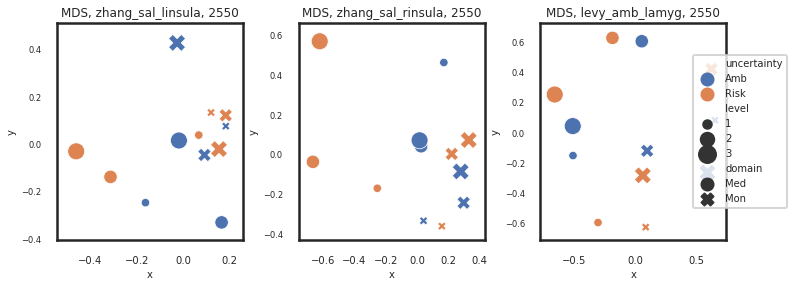

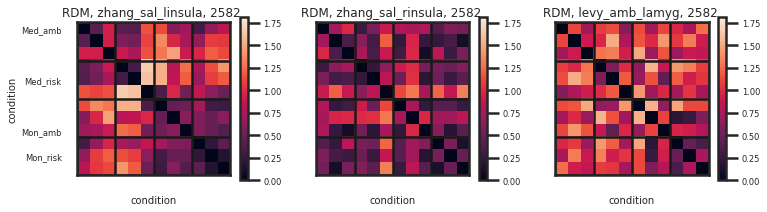

...

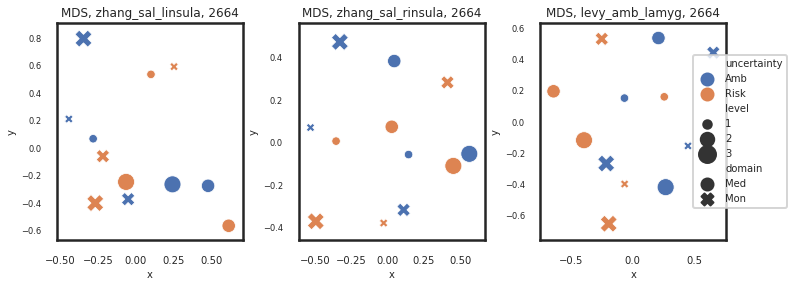

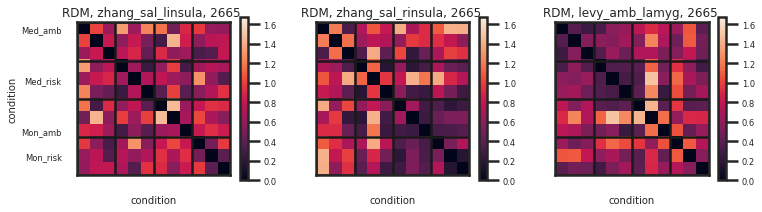

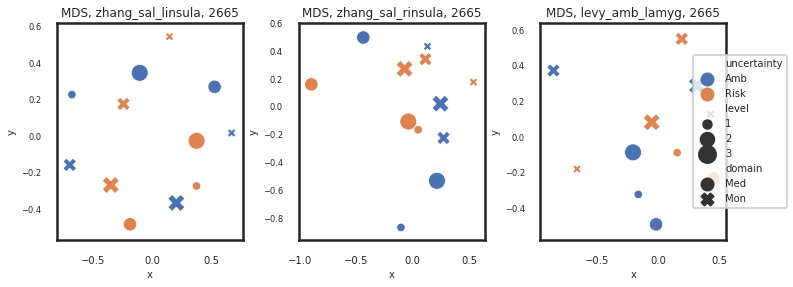

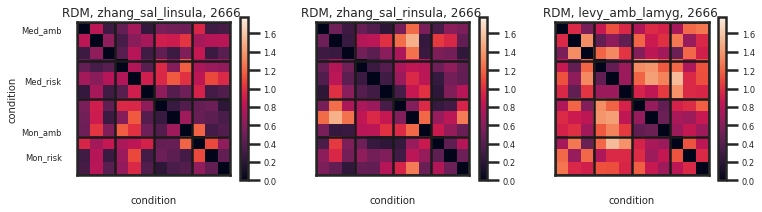

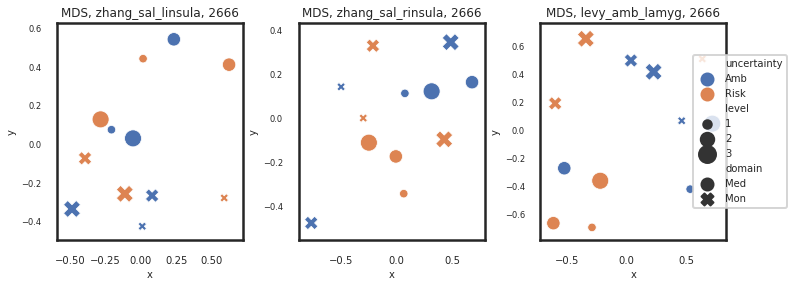

In [50]:
plot_roi_rdm(subjects, roi_names)

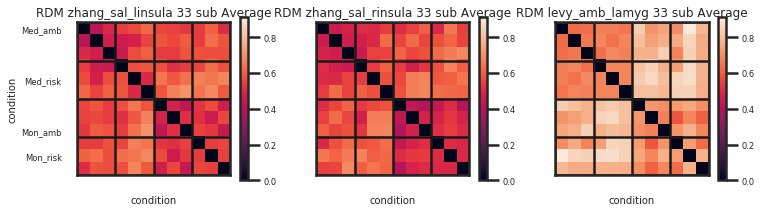

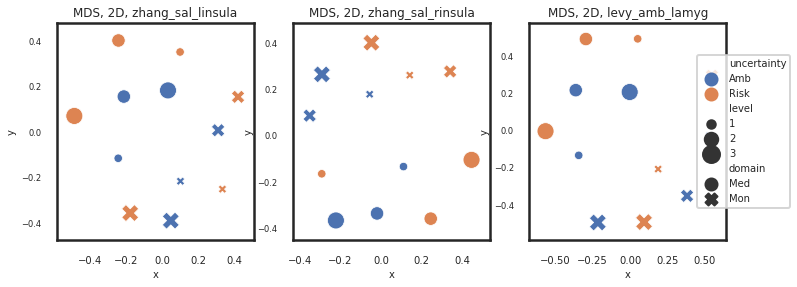

In [51]:
plot_roi_average_rdm(subjects, roi_names)

## Parahippocampal <a class = "anchor" id = "hippo-bullet"></a>

In [52]:
roi_names = ['med_mon_1', 'med_mon_2', 'med_mon_3']

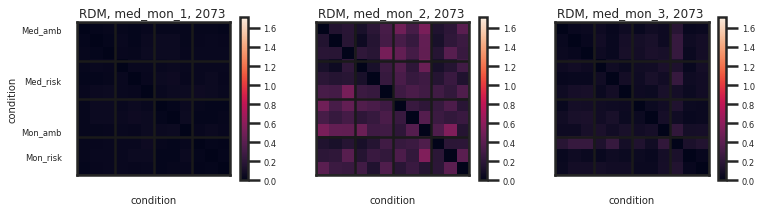

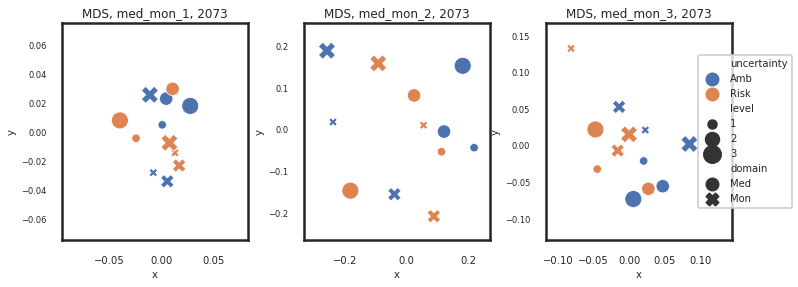

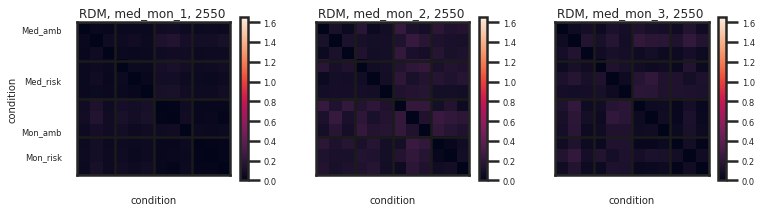

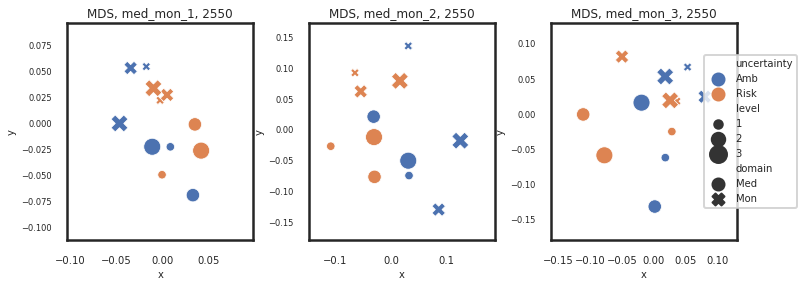

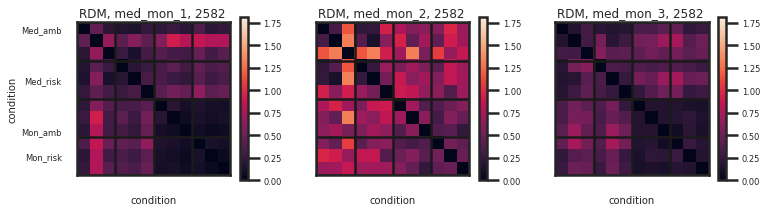

...

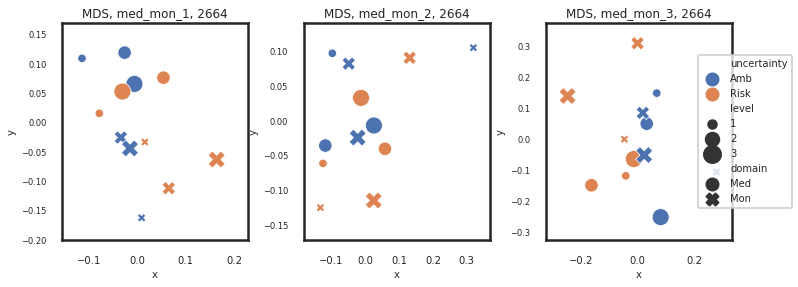

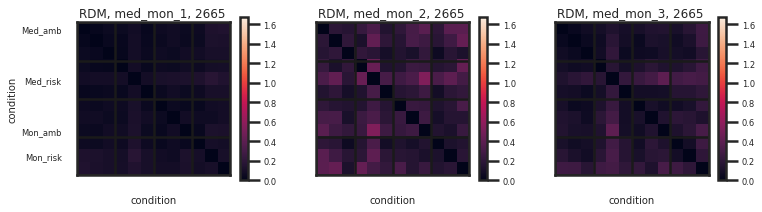

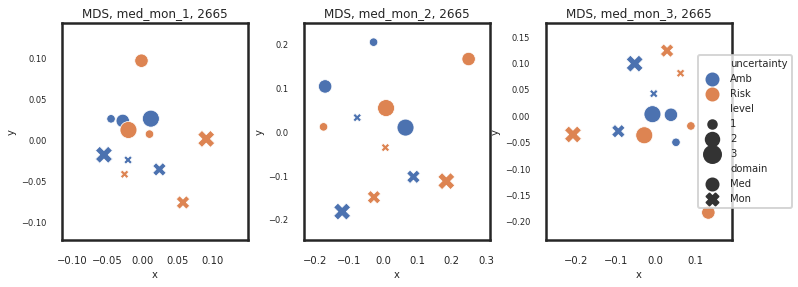

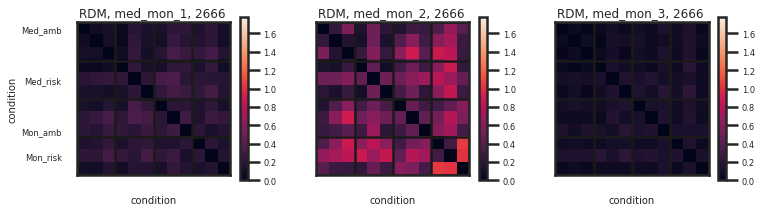

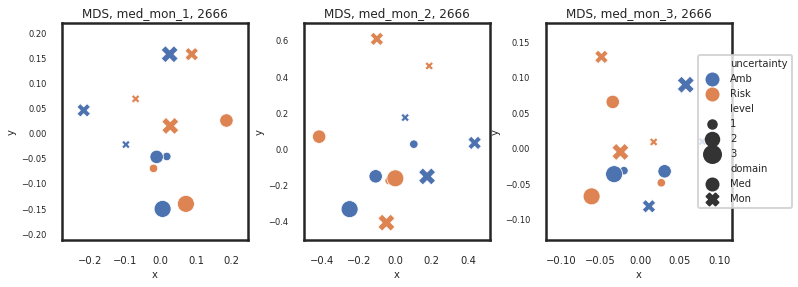

In [53]:
plot_roi_rdm(subjects, roi_names)

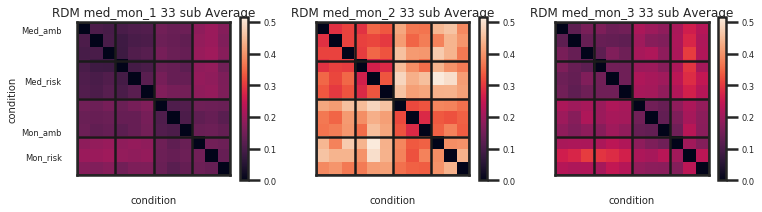

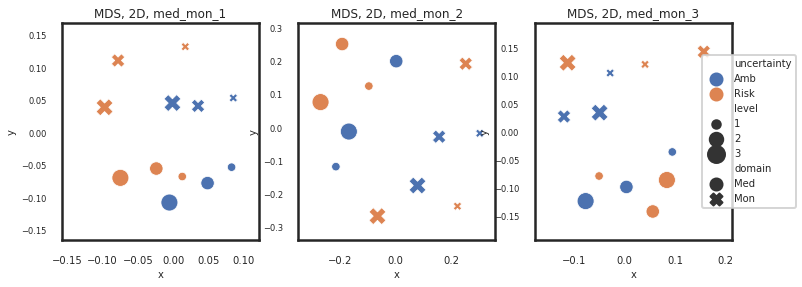

In [54]:
plot_roi_average_rdm(subjects, roi_names)

## Lingual gyrus and precentral gyrus<a class="anchor" id="lingual-bullet"></a>

In [55]:
roi_names = ['zhang_val_lingual', 'zhang_sal_lingual', 'zhang_sal_lprecentral']

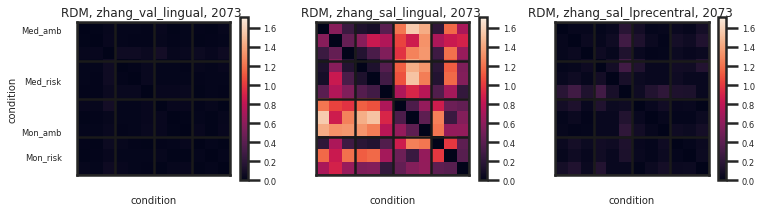

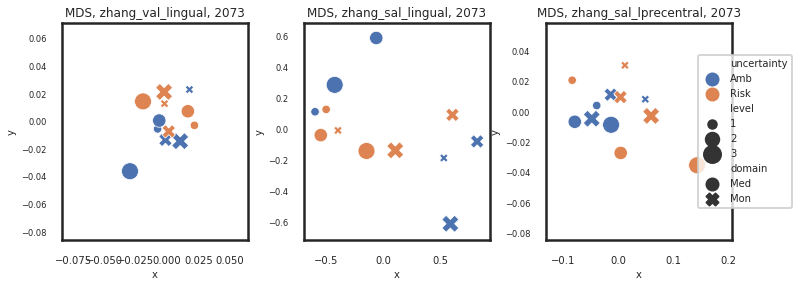

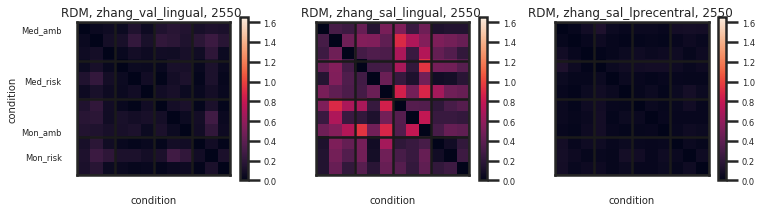

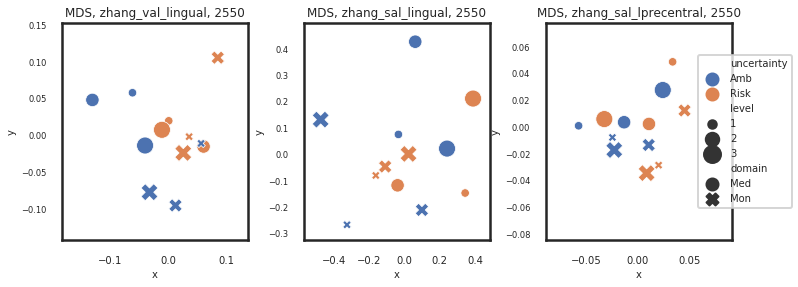

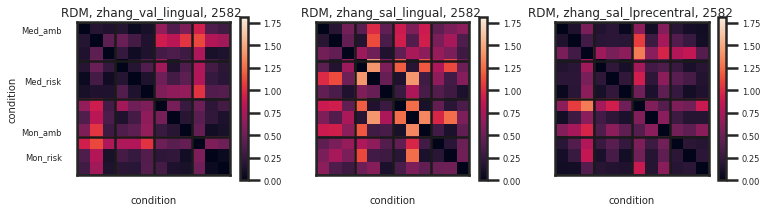

...

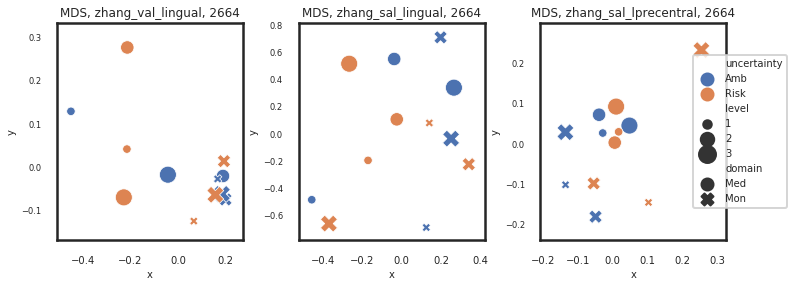

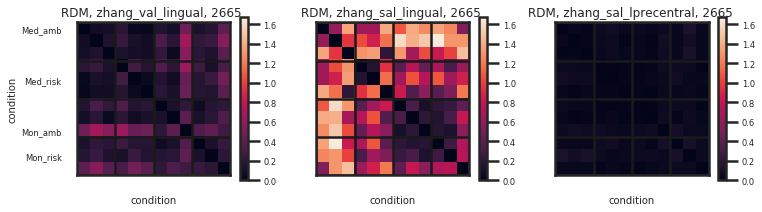

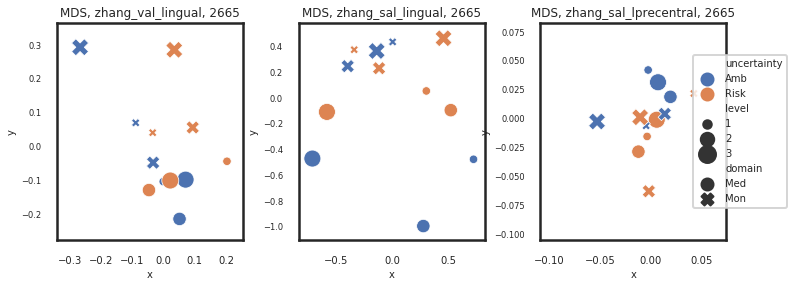

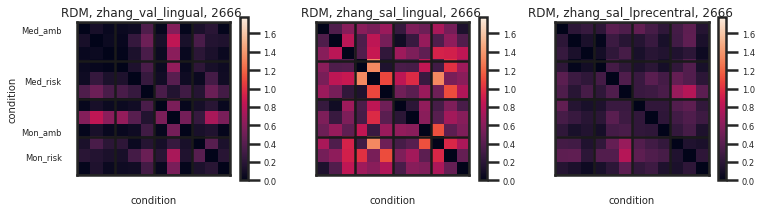

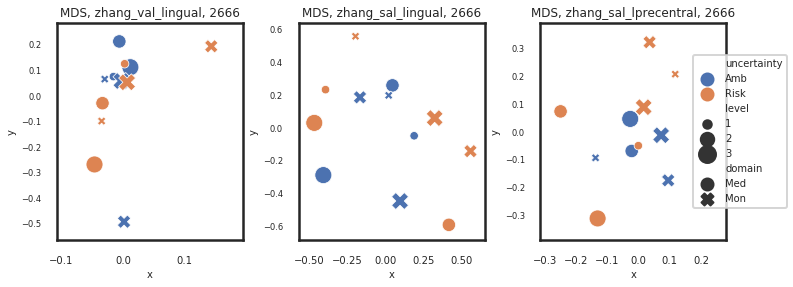

In [56]:
plot_roi_rdm(subjects, roi_names)

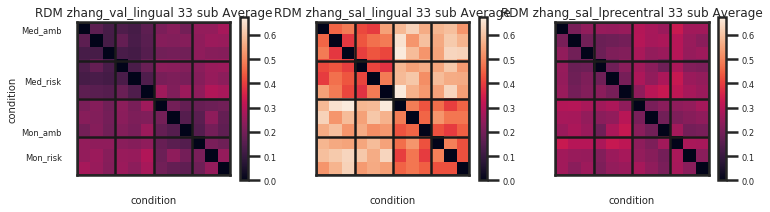

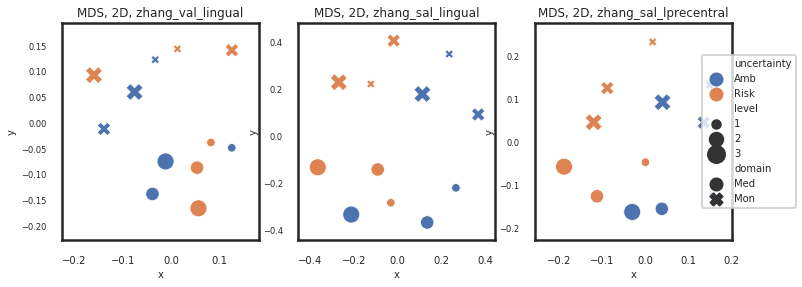

In [58]:
plot_roi_average_rdm(subjects, roi_names)